In [1]:
import tensorflow.compat.v2 as tf
print(tf.__version__)
# 2.1.0

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import cv2

mpl.rcParams['figure.figsize'] = (8, 8)
mpl.rcParams['axes.grid'] = False

2.1.0


In [2]:
#MobileNetV2: Inverted Residuals and Linear Bottlenecks
# https://arxiv.org/abs/1801.04381
pretrained_model = tf.keras.applications.MobileNetV2(include_top=True,
                                                     weights='imagenet')

# labels in the imagenet: https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a

#We are not training any model parameters
pretrained_model.trainable = False

# ImageNet labels
#These map the class integers to the actual class names in the pre-defined models.
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

(512, 640, 3)


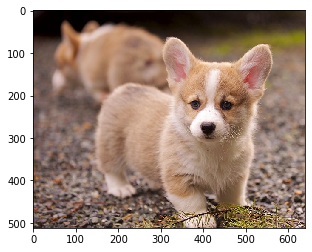

In [3]:
puppy_corgi = cv2.imread('images/puppy_corgi.jpg')
puppy_corgi = cv2.cvtColor(puppy_corgi, cv2.COLOR_BGR2RGB)
plt.imshow(puppy_corgi)

print(puppy_corgi.shape)

In [4]:
#Cast, normalize and resize the image
image = tf.cast(puppy_corgi, tf.float32)
image = image/255
image = tf.image.resize(image, (224, 224))
image = image[None, ...]
#<tf.Tensor 'strided_slice:0' shape=(1, 224, 224, 3) dtype=float32> # 1 image of size (224, 224, 3)

In [5]:
image_probs = pretrained_model.predict(image,steps=1)
#(1, 1000)
prediction = decode_predictions(image_probs, top=1)[0][0]
#('n02113023', 'Pembroke', 0.7949287)

class_probability = decode_predictions(image_probs, top=1)[0][0][2]
#0.7949287

image_class = decode_predictions(image_probs, top=1)[0][0][1]
#'Pembroke'

# Iterative Fast Gradient Sign Method (IFGSM)

It is a untargeted white-box attack.

It is also called "The Basic Iterative Method (BIM)" which is one of many extensions of FGSM, is sometimes referred to as Iterative FGSM or I-FGSM.

ORIGINAL PAPER --> https://arxiv.org/pdf/1607.02533.pdf

https://arxiv.org/pdf/1810.03739.pdf

![](images/IFGSM.png)

In [6]:
loss_object = tf.keras.losses.CategoricalCrossentropy()

def create_adversarial_pattern(input_image, input_label):
    with tf.GradientTape() as tape:
        tape.watch(input_image)
        prediction = pretrained_model(input_image)
        loss = loss_object(input_label, prediction)
        
    gradient = tape.gradient(loss, input_image)
    signed_grad = tf.sign(gradient)
    return signed_grad

In [7]:
pembroke_index = 263
label = tf.one_hot(pembroke_index, image_probs.shape[-1])
#<tf.Tensor 'one_hot:0' shape=(1000,) dtype=float32>

label = tf.reshape(label, (1, image_probs.shape[-1]))
#<tf.Tensor 'Reshape:0' shape=(1, 1000) dtype=float32>

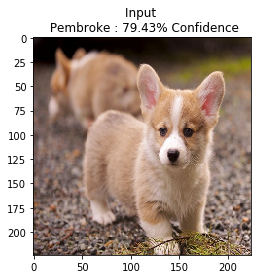

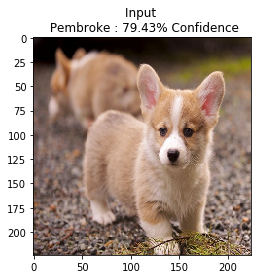

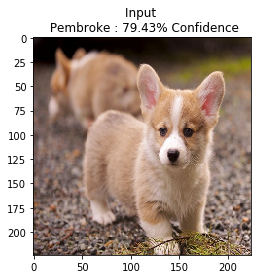

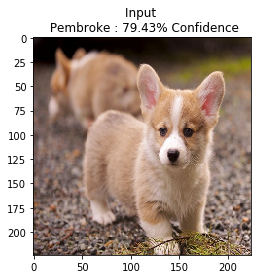

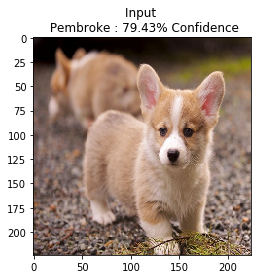

...

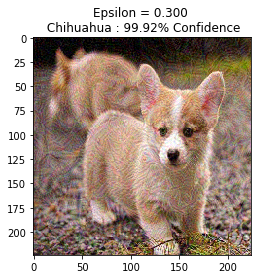

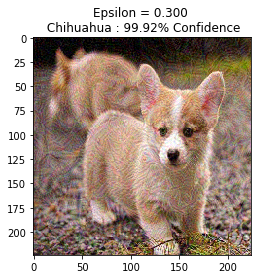

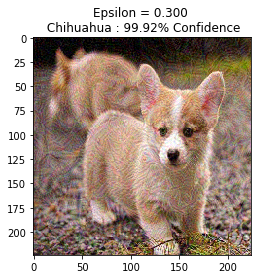

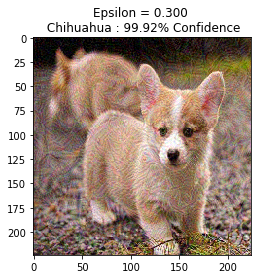

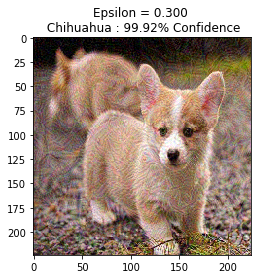

In [8]:
alpha = 1
epsilons = [0, .05, .1, .15, .2, .25, .3]
descriptions = [('Epsilon = {:0.3f}'.format(eps) if eps else 'Input')
                for eps in epsilons]

iters = 10 #number of iterations

for i, eps in enumerate(epsilons):
    adv_x = image
    alpha = eps/iters
    for j in range(iters):
        perturbations = create_adversarial_pattern(adv_x, label)
        adv_x = adv_x + alpha * perturbations
        adv_x = tf.clip_by_value(adv_x, clip_value_min= tf.math.maximum(0, tf.subtract(adv_x, eps)), clip_value_max=tf.math.minimum(1, tf.add(adv_x, eps))) 
        _, label_string, confidence = decode_predictions(pretrained_model.predict(adv_x), top=1)[0][0]
        
        #plot the adversarial images
        plt.figure()
        plt.imshow(adv_x[0])
        plt.title('{} \n {} : {:.2f}% Confidence'.format(descriptions[i], label_string, confidence*100))
        plt.show()

![](images/chihuahua.jpg)

### ANOTHER VERSION

https://arxiv.org/pdf/1607.02533.pdf

![](images/another_version_IFGSM.png)

Both FGSM and I-FGSM methods are sufficient for application to datasets such as MNIST and CIFAR-10, where the number of classes is small and all classes are highly distinct from each other. On ImageNet, with a much larger number of classes and the varying degrees of significance in the difference between classes, these methods can result in uninteresting misclassifications, such as mistaking one breed of sled dog for another breed of sled dog (For instance, ImageNet includes examples of both Siberian Huskies and Alaskan Malamutes - both wolflike dogs). In order to create more interesting mistakes, we introduce the **iterative least-likely class method**, which aims to maximize the negative impact of an attack through dramatic misclassification (e.g., dog -> airplane), while minimizing input perturbations